In [1]:
from astropy.io import ascii
import glob
import matplotlib.pyplot as plt
import numpy as np
from scipy import asarray as ar, exp
from scipy.optimize import curve_fit, least_squares
import re
%matplotlib inline

snls_colors = {"sdssg":"darkgreen", "sdssi":"darkblue", "sdssr":"darkred", "sdssz":"purple"}
base_colors = {"sdssg":"green", "sdssi":"blue", "sdssr":"red", "sdssz":"magenta"}

import astropy.coordinates as coord
import astropy.units as u
import Utils.DiaSourceTools as DSTools

import sncosmo

In [2]:
def show_multi_filter_light_curve(t, colors, n_factor = None, conv='.'):
   
    t_by_filter = t.group_by("bandpass")

    indices = t_by_filter.groups.indices
    
    #print indices
    for i in range(0, len(indices)-1):
        
        data = t_by_filter[indices[i]:indices[i+1]]
        
        if n_factor is not None:
            value = n_factor[data[0]["bandpass"]]
            f = value if np.isnan(value) == False else 1
            plt.errorbar(data["mjd"], data["flux"]*f,yerr=data["flux_error"]*f, fmt=conv, markersize='5', label=data[0]["bandpass"], c=colors[data[0]["bandpass"]])            
        else:
            plt.errorbar(data["mjd"], data["flux"],yerr=data["flux_error"], fmt=conv, markersize='5', label=data[0]["bandpass"], c=colors[data[0]["bandpass"]])
    plt.legend()
    #plt.show()
    
def mod_gauss(t, a, t0, tf, tr, b):
    return a*((exp(-(t-t0)/tf))/(1+exp(-(t-t0)/tr)))+b

def get_max_index(fluxes):
    max_val = 0
    max_index = -1
    for i, elem in enumerate(fluxes):
        
        if max_val<elem:
            max_val = elem
            max_index = i
            
    return max_index

    
def show_fit_mod_gaussians(t, colors, n_factor = None, plot=True, show_means=False):

    
    t_by_filter = t.group_by("bandpass")

    
    min_date = min(t["mjd"])
    max_date = max(t["mjd"])
    
     
    indices = t_by_filter.groups.indices
    
    #max_i = get_max_index(t_by_filter["flux"])
    #mean_date = t_by_filter[max_i]["mjd"]-min_date
    
  
    for i in range(0, len(indices)-1):

        data = t_by_filter[indices[i]:indices[i+1]]
        x = data["mjd"]-min_date
        y = data["flux"]
        
        
        max_i = get_max_index(data["flux"])
        mean_date = data[max_i]["mjd"]-min_date
        
        
        n = len(x)
        sigma = np.std(y)
        
        
        popt, pcov = curve_fit(mod_gauss, x, y, p0=[data[max_i]["flux"], mean_date, 2, 1.5, 0], maxfev=500000,  sigma = data["flux_error"])
        
        
        c = (y - mod_gauss(x, *popt))
        chi = (y - mod_gauss(x, *popt))/data["flux_error"]
    
        chi2 = (chi**2).sum()
        dof = len(x) - len(popt)

        #print len(x) - len(popt)
        #print (chi2 / (len(x)-len(popt)))
        if plot==True:
            plt.plot(x, y, 'b+', color=colors[data[0]["bandpass"]])
            
            X = np.arange(0,max_date-min_date,1)

            plt.plot(X, mod_gauss(X, *popt), color=colors[data[0]["bandpass"]])
            if show_means:
                print mean_date
                plt.axvline(x=mean_date, color=colors[data[0]["bandpass"]], linestyle="dotted")
            plt.xlim(xmin=-10)
        #print gauss(X, *popt)
        #plt.xlim(xmin=400, xmax=500)
        #plt.show()
        #plt.legend()
    #plt.show()
    return popt, pcov, chi2, dof

    


In [3]:
f = open('/renoir_data_02/jpreyes/lsst_data/sn_control/J_A+A_523_A7_table9.dat.txt','r')
data_elems = f.read()
elems = re.findall('^(.*?D3.*?)\\|(.*?)\\|(.*?)\\|(.*?)\\|(.*?)\\|(.*?)\\|(.*?)\\|', data_elems, re.MULTILINE)
f.close()

f = open('/renoir_data_02/jpreyes/lsst_data/sn_control/J_A+A_523_A7_table10.dat.txt','r')
data = f.read()
f.close()


In [7]:
snls_array = []
for sn in elems:

        c = coord.SkyCoord(sn[1], unit=(u.hourangle, u.deg))

        m = re.findall('^'+str(sn[0])+'\\|(r|g|z|i)\\|(.*?)\\|(.*?)\\|(.*?)$', data, re.MULTILINE)

        snls_lc = DSTools.build_light_curve_from_snls_file_2(m, c, sn[0], sn[-1])

        if len(m)>0:
            #print sn[0], c.ra.deg, c.dec.deg

            #plt.errorbar(snls_lc['mjd'], snls_lc['flux'], yerr=snls_lc['flux_error'], fmt='.', color='blue')
            #show_multi_filter_light_curve(snls_lc, snls_colors)
            plt.show()
            snls_array.append(snls_lc)

print("total of sn:" + str(len(snls_array)))

total of sn:83


In [8]:
snls_array[0]

mjd,dec,zpsys,flux,ra,flux_error,z,zp,id,bandpass
float64,float64,str2,float64,float64,float64,str6,float64,str6,str5
52721.54,0.916953761726,ab,528.11,3.75790310089,19.791,0.5320,25.0,03D3af,sdssi
52721.59,0.916953761726,ab,526.52,3.75790310089,17.93,0.5320,25.0,03D3af,sdssr
52723.6,0.916953761726,ab,687.26,3.75790310089,31.252,0.5320,25.0,03D3af,sdssi
52730.44,0.916953761726,ab,848.87,3.75790310089,29.197,0.5320,25.0,03D3af,sdssi
52730.49,0.916953761726,ab,674.83,3.75790310089,15.149,0.5320,25.0,03D3af,sdssr
52753.55,0.916953761726,ab,583.25,3.75790310089,91.767,0.5320,25.0,03D3af,sdssi
52755.48,0.916953761726,ab,214.5,3.75790310089,12.675,0.5320,25.0,03D3af,sdssr
52758.44,0.916953761726,ab,457.5,3.75790310089,19.898,0.5320,25.0,03D3af,sdssi
52759.46,0.916953761726,ab,131.27,3.75790310089,12.784,0.5320,25.0,03D3af,sdssr


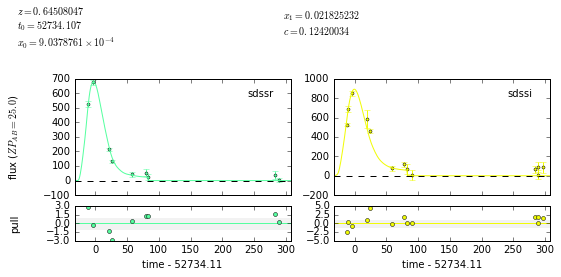

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:160: RuntimeWarning: Dropping following bands from data: sdssz, sdssg(out of model wavelength range)
  "(out of model wavelength range)", RuntimeWarning)


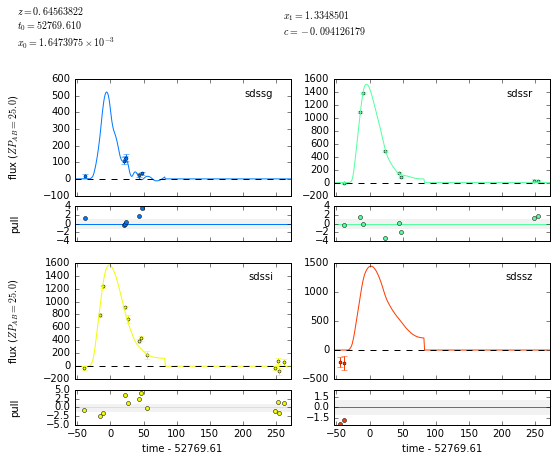

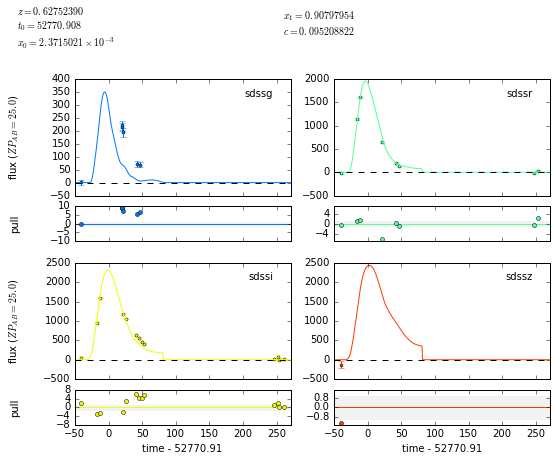

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:160: RuntimeWarning: Dropping following bands from data: sdssg, sdssz(out of model wavelength range)
  "(out of model wavelength range)", RuntimeWarning)


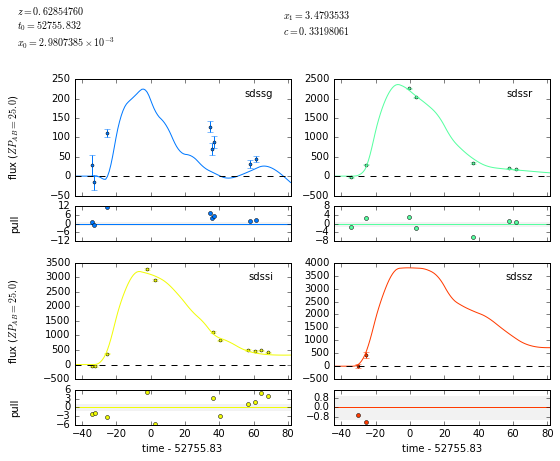

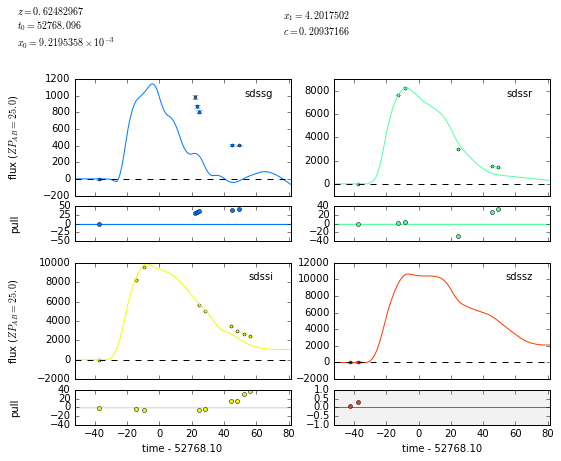

/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/sncosmo/fitting.py:160: RuntimeWarning: Dropping following bands from data: sdssg(out of model wavelength range)
  "(out of model wavelength range)", RuntimeWarning)


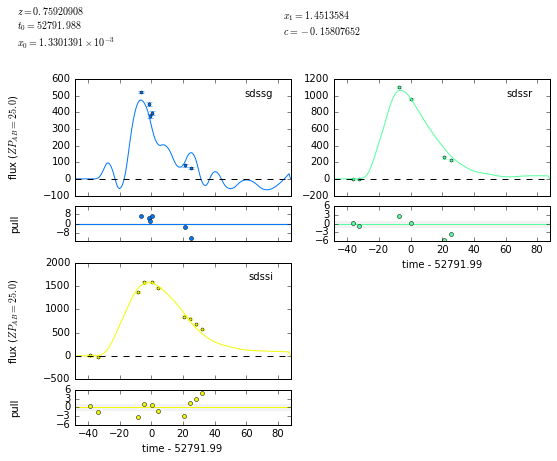

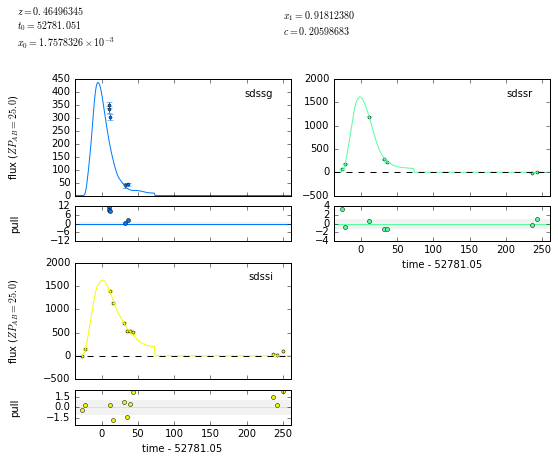

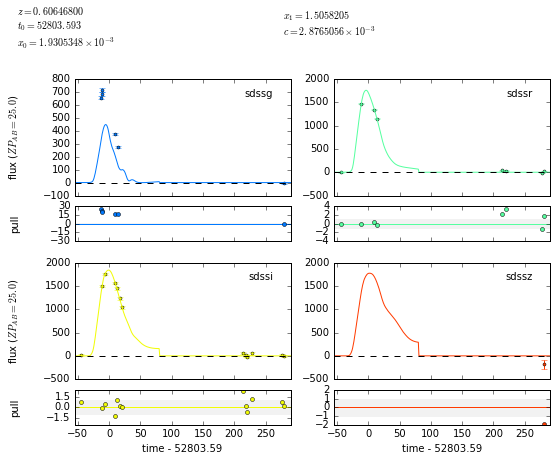

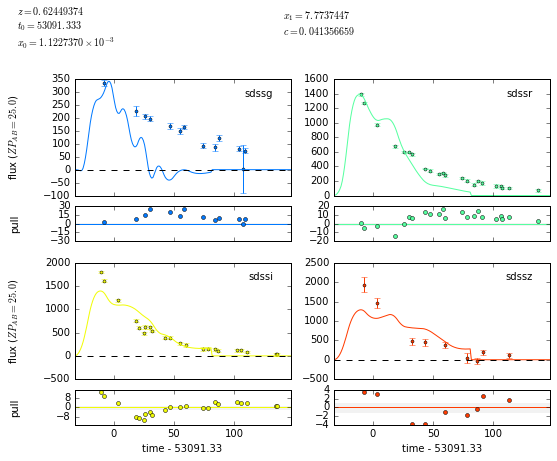

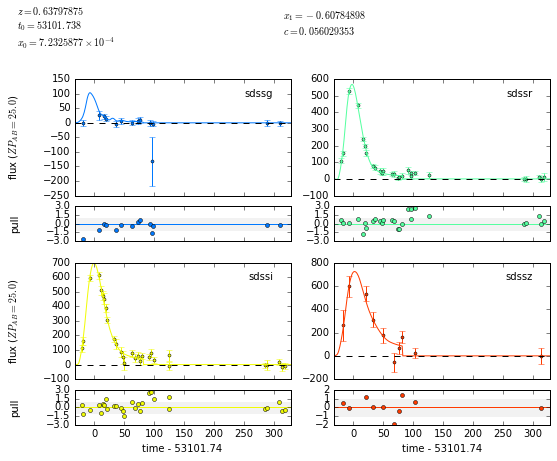

...

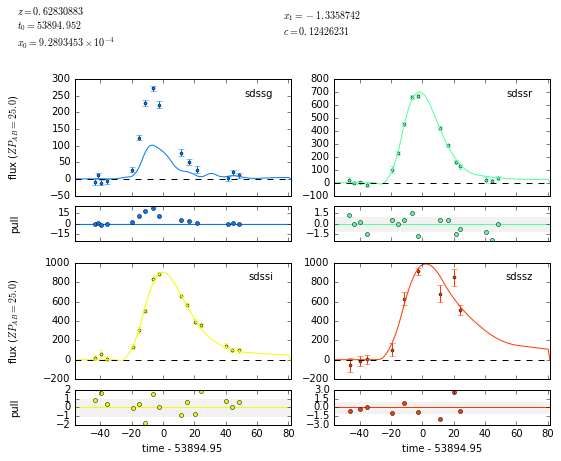

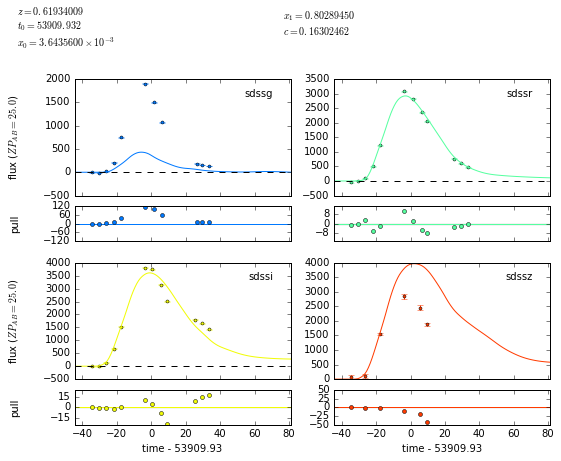

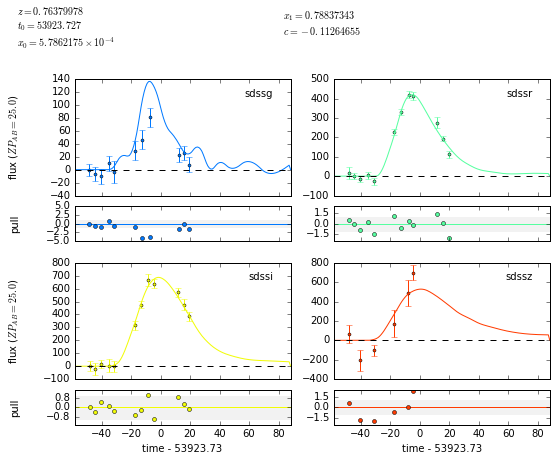

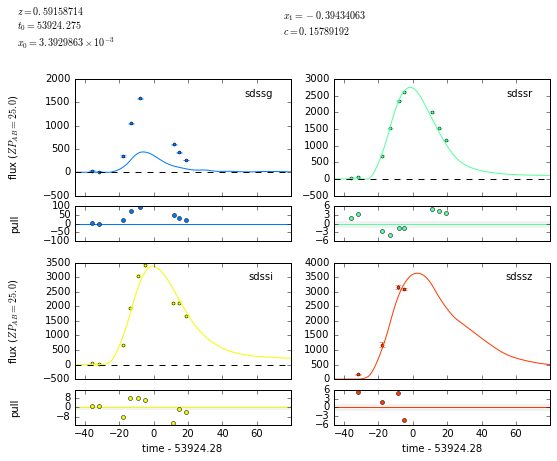

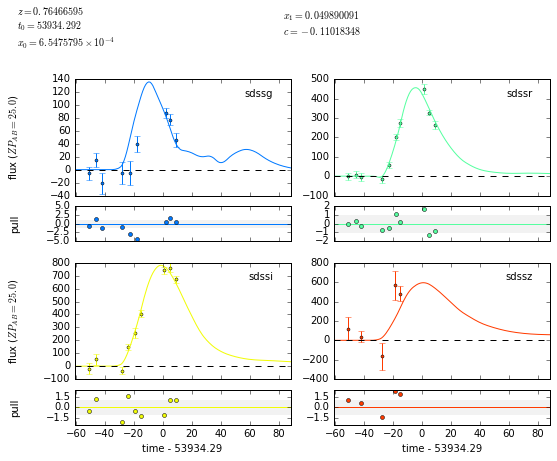

In [5]:
f_models = []
chi_sqrds = []
Zs = []
errors = 0
for s in snls_array:
    
    try:
        #This instruction loades the model
        model = sncosmo.Model(source='salt2')
        #This fits the light curve, s is the light curve, model is the loaded model, the next array indicates the values to be estimates and bounds helps to give a range for Redshift
        res, fitted_model = sncosmo.fit_lc(s, model, ['z', 't0', 'x0', 'x1', 'c'],  bounds={'z':(0.1, 1.3)})
        Zs.append(fitted_model.get("z"))
        #Instruction to plot the result with the fitted model
        sncosmo.plot_lc(s, model=fitted_model)
        plt.show()
        #Getting the number of degrees of fitting
        df = res.ndof  # number of degrees of freedom in fit
        #Getting the Chi Squared 
        chisq = res.chisq
        f_models.append(fitted_model)
        chi_sqrds.append(chisq/df)
    except Exception as e:
        print e
        errors+=1
        continue

In [6]:
s

mjd,dec,zpsys,flux,ra,flux_error,z,zp,id,bandpass
float64,float64,str2,float64,float64,float64,str6,float64,str6,str5
53883.35,0.92391190464,ab,-21.308,3.73960310551,42.115,0.7600,25.0,06D3gx,sdssi
53883.37,0.92391190464,ab,-1.35,3.73960310551,17.528,0.7600,25.0,06D3gx,sdssr
53883.38,0.92391190464,ab,-5.9105,3.73960310551,10.449,0.7600,25.0,06D3gx,sdssg
53883.42,0.92391190464,ab,118.22,3.73960310551,119.49,0.7600,25.0,06D3gx,sdssz
53888.36,0.92391190464,ab,54.146,3.73960310551,43.076,0.7600,25.0,06D3gx,sdssi
53888.38,0.92391190464,ab,6.1937,3.73960310551,18.203,0.7600,25.0,06D3gx,sdssr
53888.4,0.92391190464,ab,14.376,3.73960310551,10.761,0.7600,25.0,06D3gx,sdssg
53892.35,0.92391190464,ab,-5.454,3.73960310551,19.695,0.7600,25.0,06D3gx,sdssr
53892.37,0.92391190464,ab,-20.835,3.73960310551,16.242,0.7600,25.0,06D3gx,sdssg


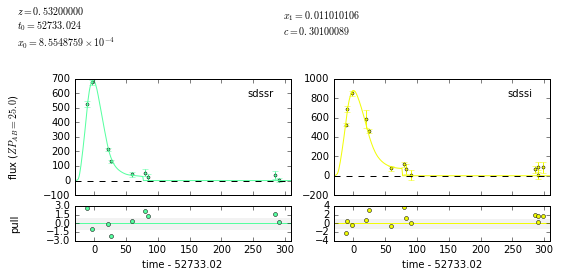

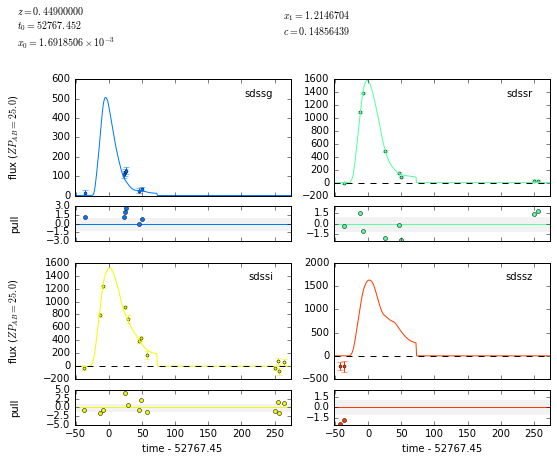

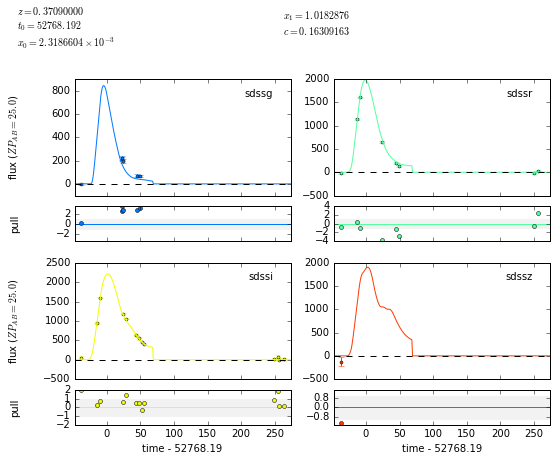

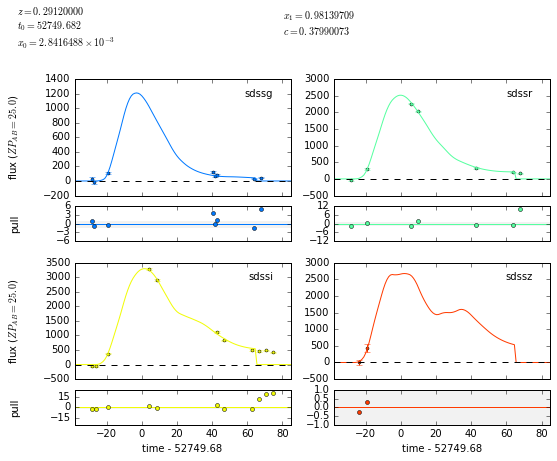

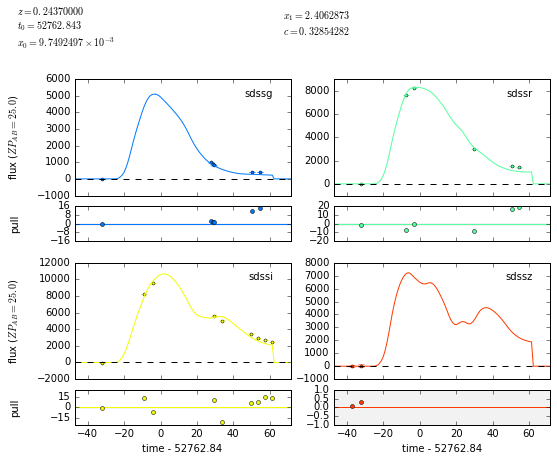

...

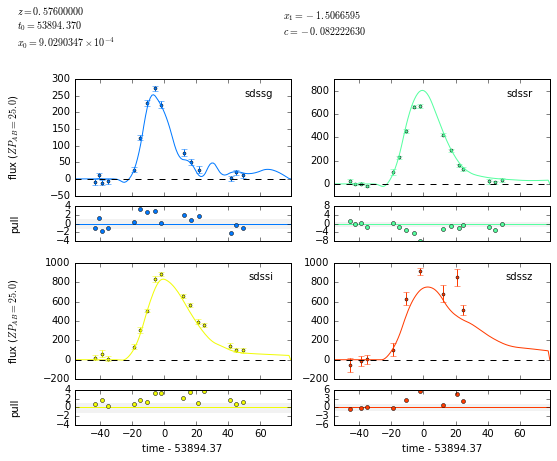

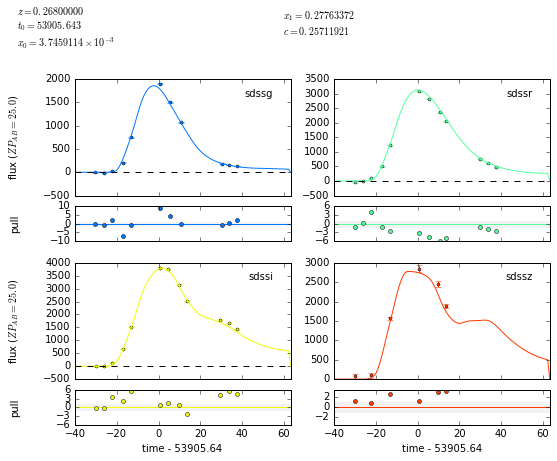

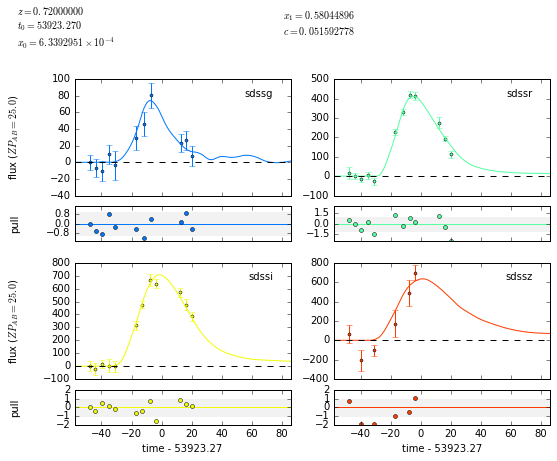

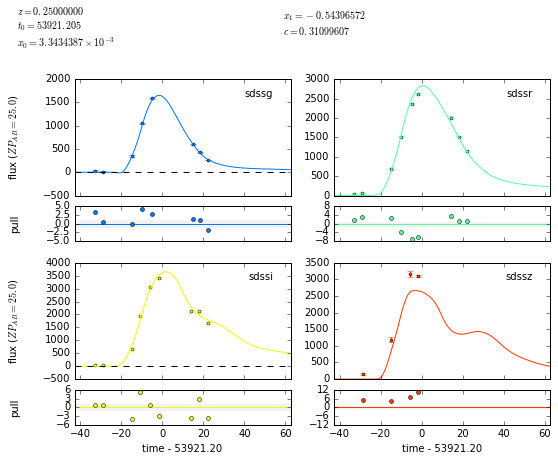

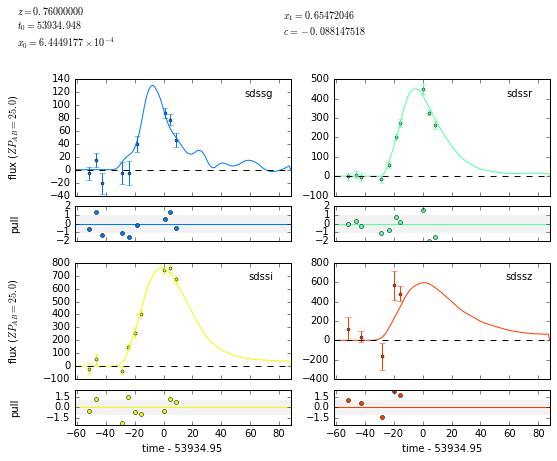

In [22]:
f_models = []
chi_sqrds = []
Zs = []
errors = 0
for s in snls_array:
    
    try:
        #This instruction loades the model
        model = sncosmo.Model(source='salt2')
        #This fits the light curve, s is the light curve, model is the loaded model, the next array indicates the values to be estimates and bounds helps to give a range for Redshift
        model.set(z=s["z"][0])
        res, fitted_model = sncosmo.fit_lc(s, model, [ 't0', 'x0', 'x1', 'c'])
        Zs.append(fitted_model.get("z"))
        #Instruction to plot the result with the fitted model
        sncosmo.plot_lc(s, model=fitted_model)
        plt.show()
        #Getting the number of degrees of fitting
        df = res.ndof  # number of degrees of freedom in fit
        #Getting the Chi Squared 
        chisq = res.chisq
        f_models.append(fitted_model)
        chi_sqrds.append(chisq/df)
    except Exception as e:
        print e
        errors+=1
        continue

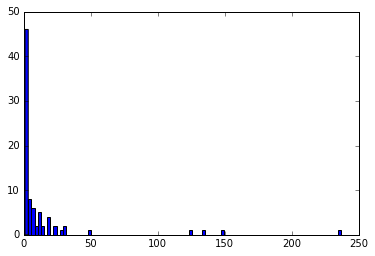

(61, ' of ', 83)


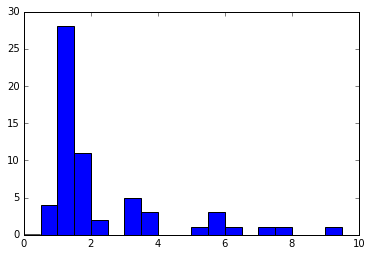

In [25]:
plt.hist(chi_sqrds, bins=100)
plt.show()


a = np.array(chi_sqrds)
b = a[a < 10]
plt.hist(b, bins=20, range=(0,10))
print(len(b), " of ",len(chi_sqrds))

In [10]:
diff_z= []
for lc, z_snls in zip(snls_array, Zs):
    diff_z.append(float(z_snls)-float(lc[0]["z"]))

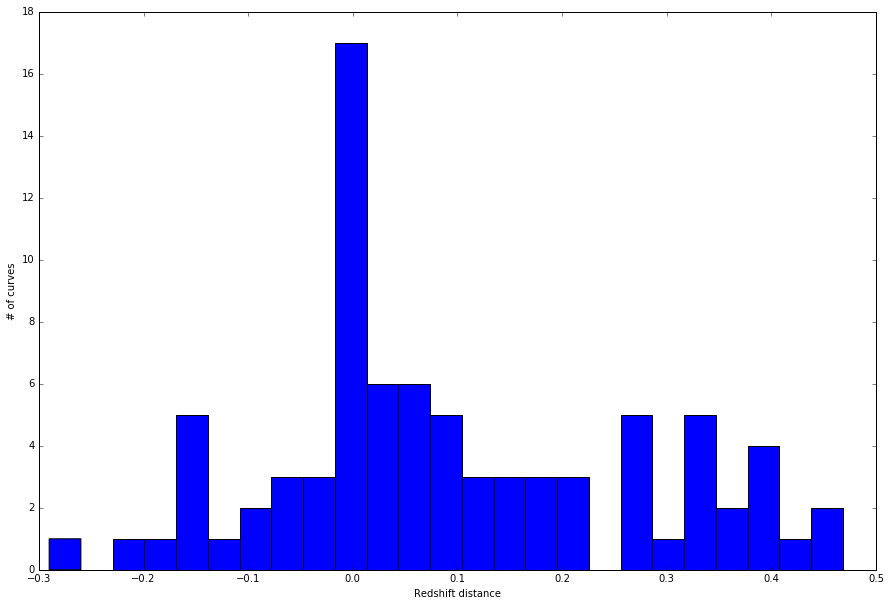

In [17]:
plt.figure(figsize=(15,10))
plt.hist(diff_z, bins=25)
plt.xlabel("Redshift distance")
plt.ylabel("# of curves")
plt.show()

In [8]:
def skewed_gaussian_chi(lc):
    lc_c = []

    mask = lc["bandpass"] == "sdssi"
    lc_c.append(lc[mask])

    mask = lc["bandpass"] == "sdssg"
    lc_c.append(lc[mask])

    mask = lc["bandpass"] == "sdssz"
    lc_c.append(lc[mask])

    mask = lc["bandpass"] == "sdssr"
    lc_c.append(lc[mask])
    
    chi_sqrds = []
    dofs = []
    
    for l in lc_c:
        
        if len(l) > 5:
            try:
                opt, pcov, chi, dof = show_fit_mod_gaussians(l, snls_colors, plot=True)
                chi_sqrds.append(chi)
                dofs.append(dof)
            except Exception as e:
                print e
                chi_sqrds.append(10000)
                dofs.append(1)

      
        
    return np.sum(chi_sqrds)  / np.sum(dofs)

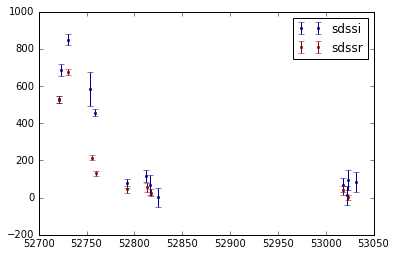

In [16]:
show_multi_filter_light_curve(snls_array[0], snls_colors)

64.82
32.86
33.89
Improper input: N=5 must not exceed M=2


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: overflow encountered in exp


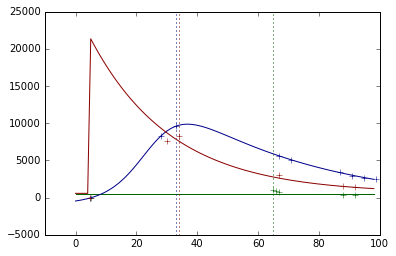

In [88]:
try:
    opt, pcov, chi, dof = show_fit_mod_gaussians(snls_array[4], snls_colors, plot=True, show_means=True)
except Exception as e:
    print e

>>>>>>>>0


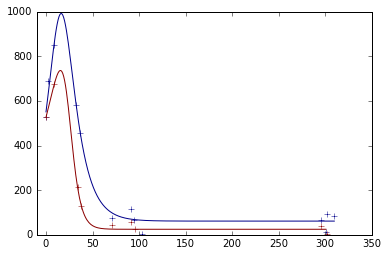

>>>>>>>>1


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: overflow encountered in exp


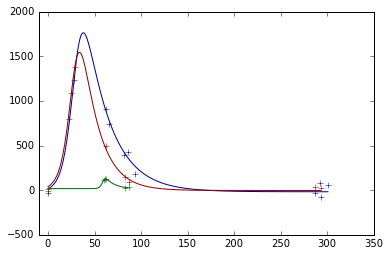

>>>>>>>>2


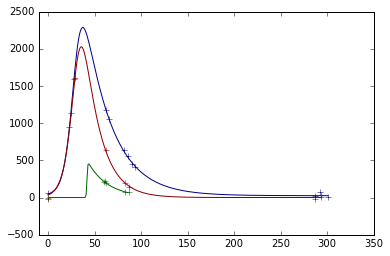

>>>>>>>>3


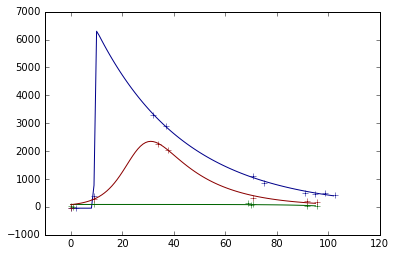

>>>>>>>>4


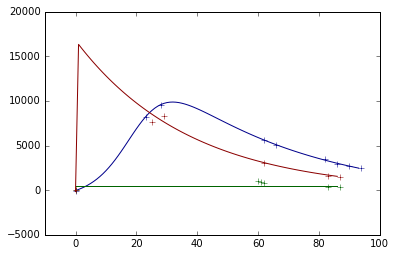

>>>>>>>>5


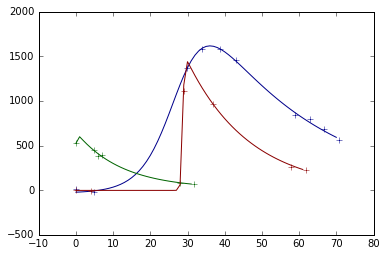

>>>>>>>>6


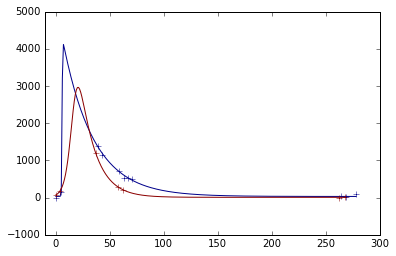

>>>>>>>>7


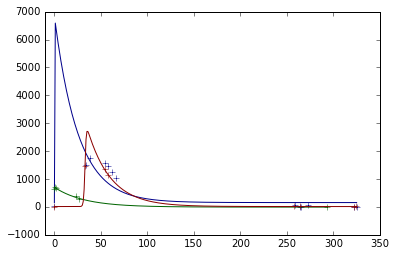

>>>>>>>>8


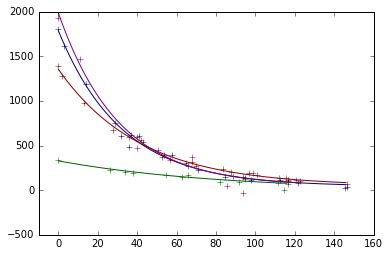

>>>>>>>>9


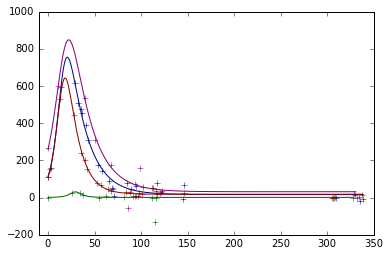

>>>>>>>>10


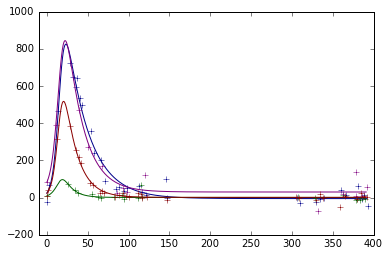

>>>>>>>>11


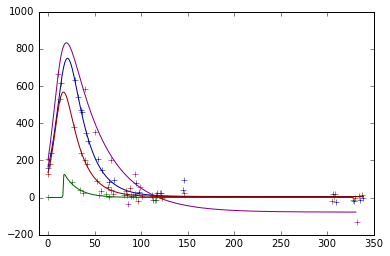

>>>>>>>>12


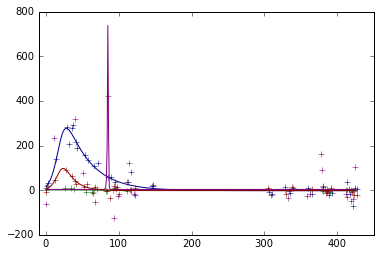

>>>>>>>>13


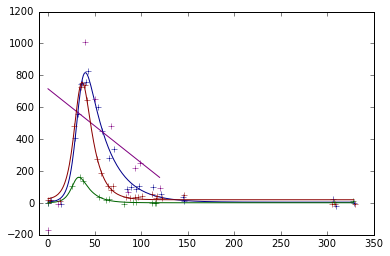

>>>>>>>>14


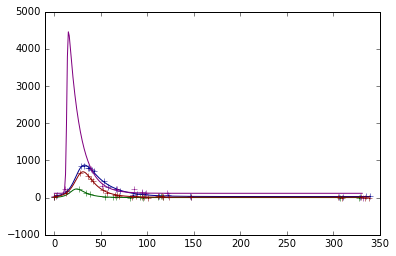

>>>>>>>>15


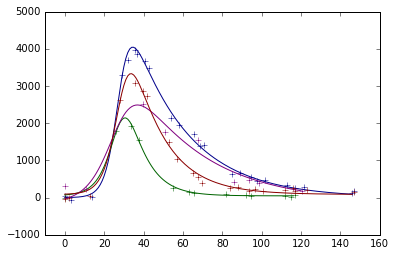

>>>>>>>>16


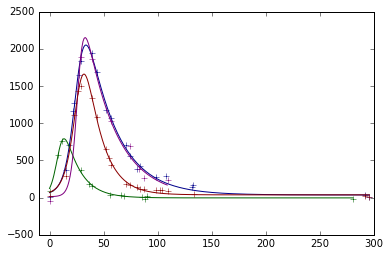

>>>>>>>>17


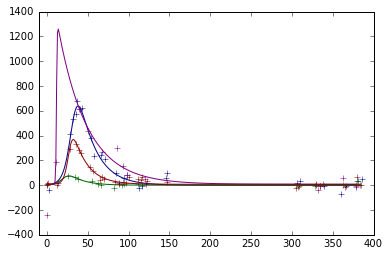

>>>>>>>>18


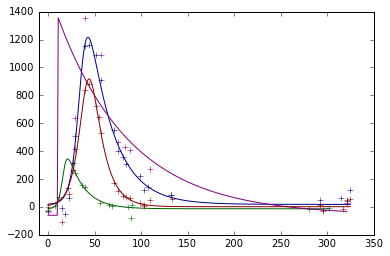

>>>>>>>>19


/renoir_data_00/fouchez/lsst/DM/stacks/lsstsw/2017-05-04/lsstsw/miniconda/lib/python2.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in divide


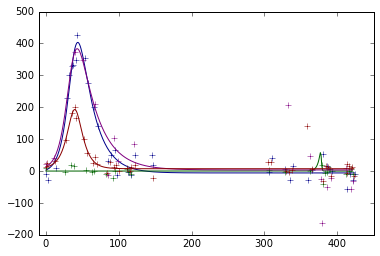

>>>>>>>>20


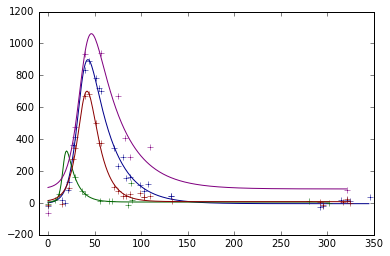

>>>>>>>>21


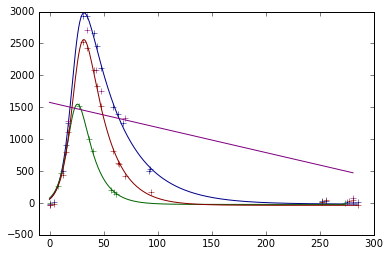

>>>>>>>>22


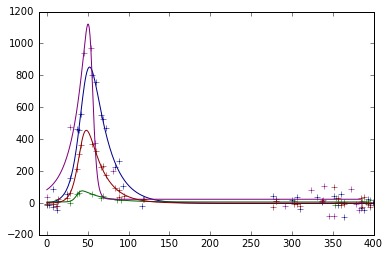

>>>>>>>>23


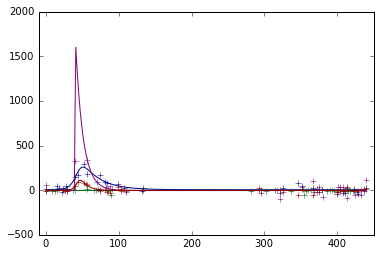

>>>>>>>>24


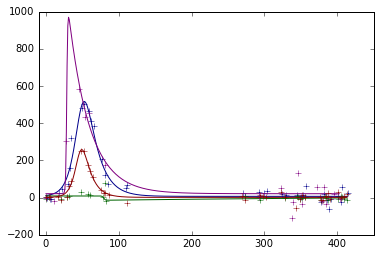

>>>>>>>>25


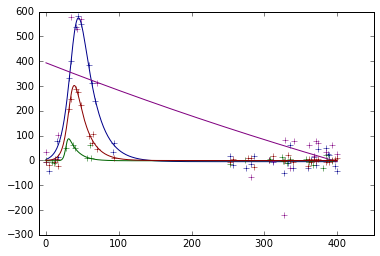

>>>>>>>>26


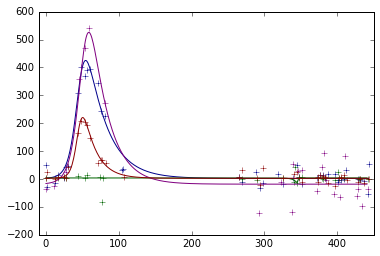

>>>>>>>>27


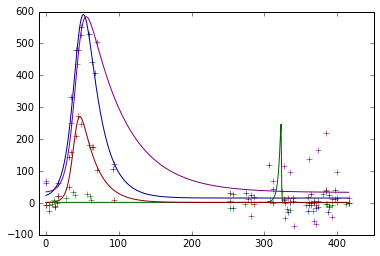

>>>>>>>>28


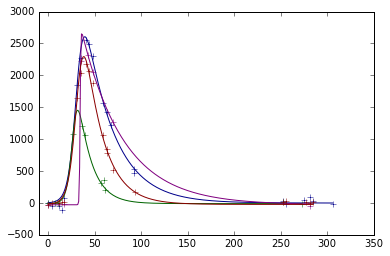

>>>>>>>>29


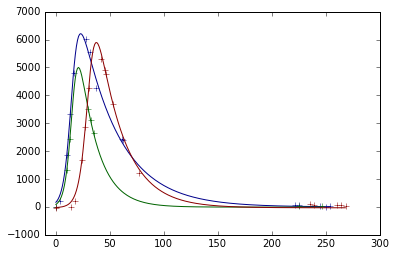

>>>>>>>>30


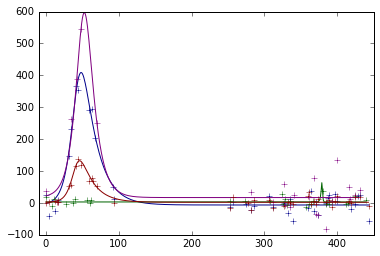

>>>>>>>>31


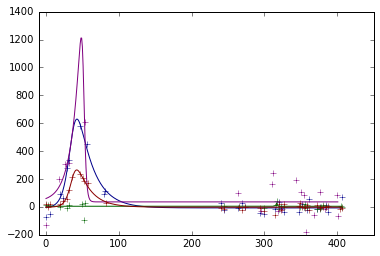

>>>>>>>>32


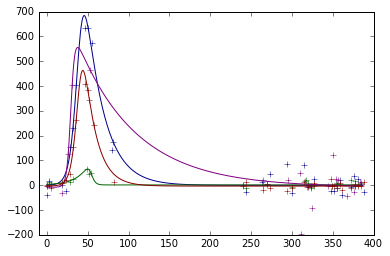

>>>>>>>>33


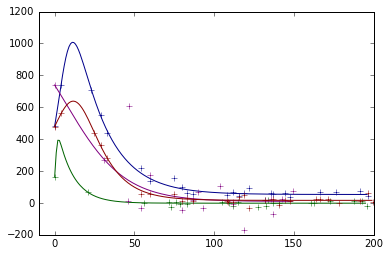

>>>>>>>>34


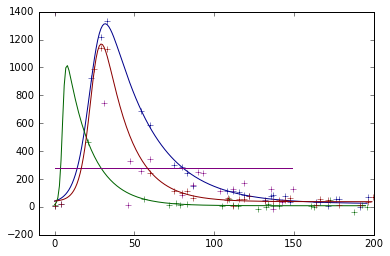

>>>>>>>>35


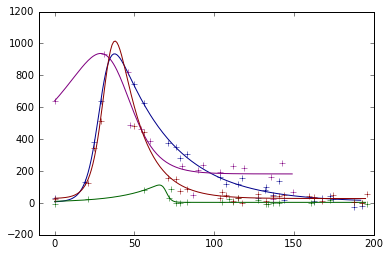

>>>>>>>>36


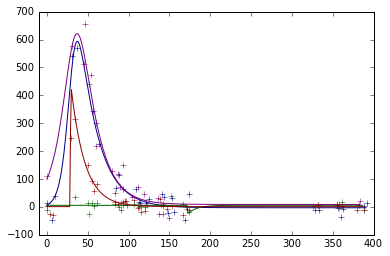

>>>>>>>>37


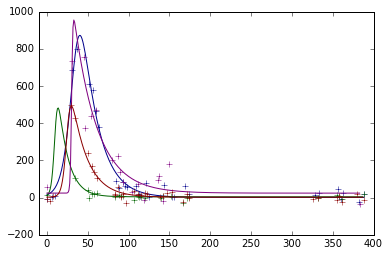

>>>>>>>>38


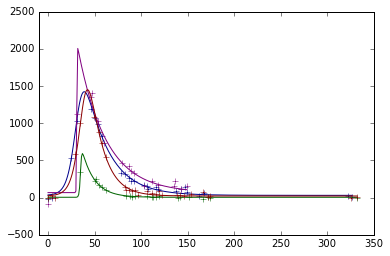

>>>>>>>>39


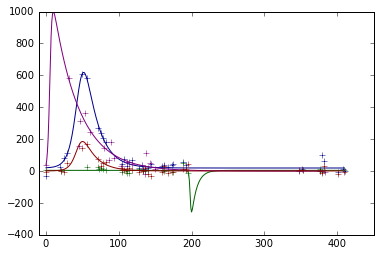

>>>>>>>>40


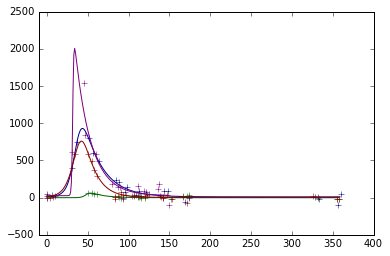

>>>>>>>>41


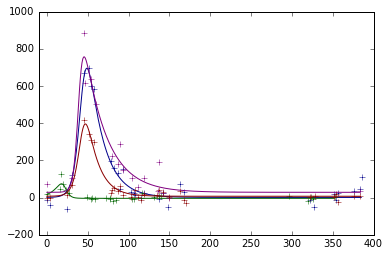

>>>>>>>>42


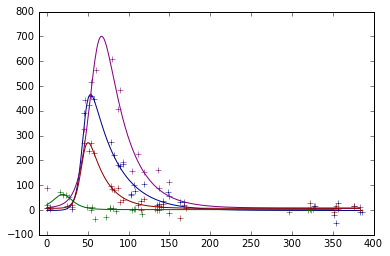

>>>>>>>>43


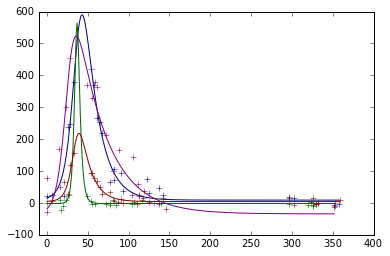

>>>>>>>>44


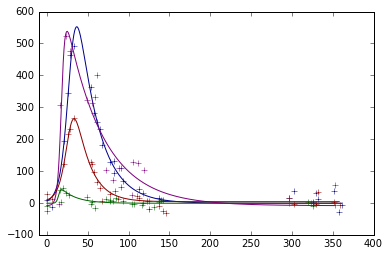

>>>>>>>>45


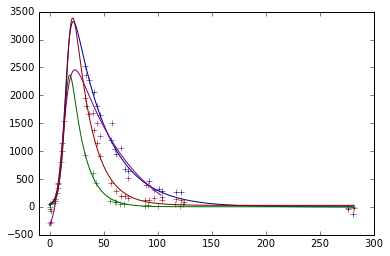

>>>>>>>>46


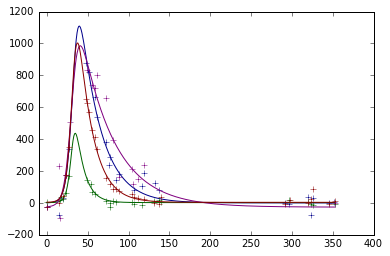

>>>>>>>>47


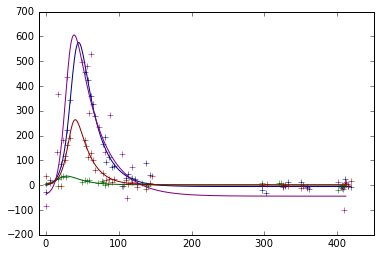

>>>>>>>>48


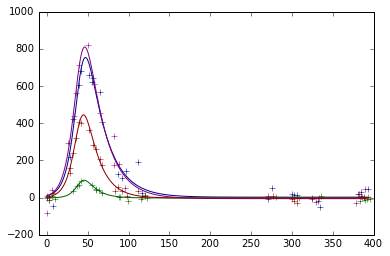

>>>>>>>>49


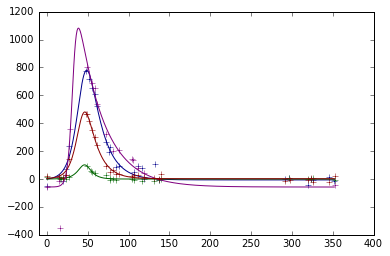

>>>>>>>>50


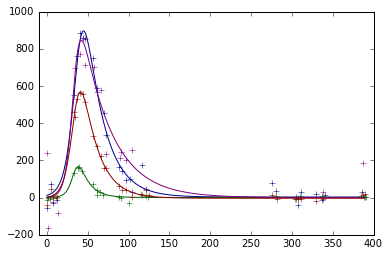

>>>>>>>>51


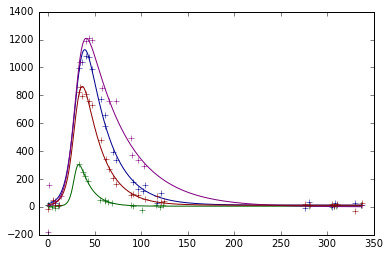

>>>>>>>>52


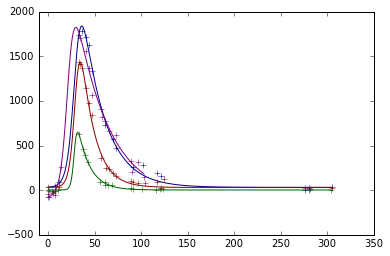

>>>>>>>>53


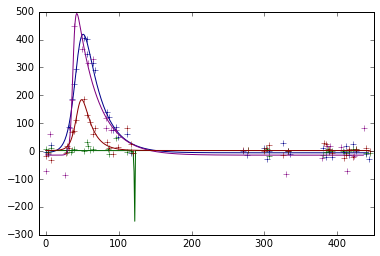

>>>>>>>>54


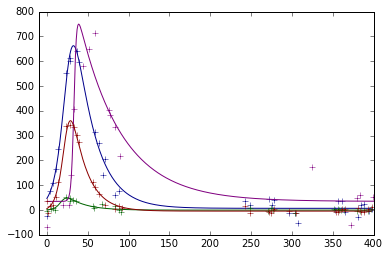

>>>>>>>>55


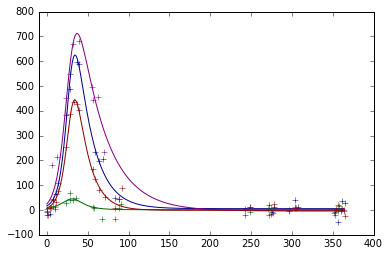

>>>>>>>>56


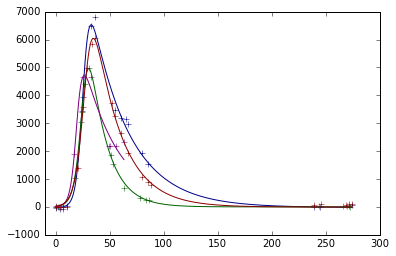

>>>>>>>>57


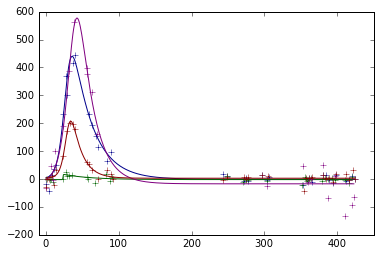

>>>>>>>>58


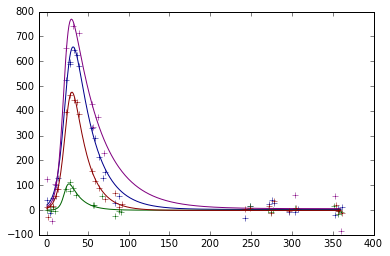

>>>>>>>>59


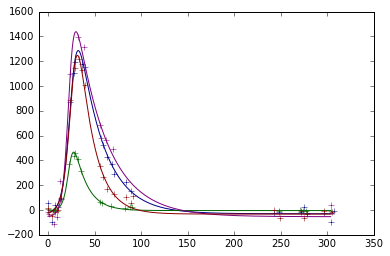

>>>>>>>>60


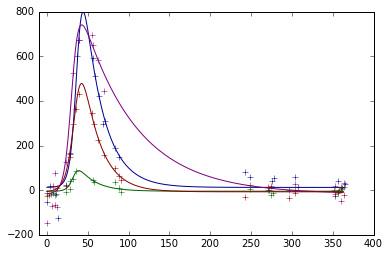

>>>>>>>>61


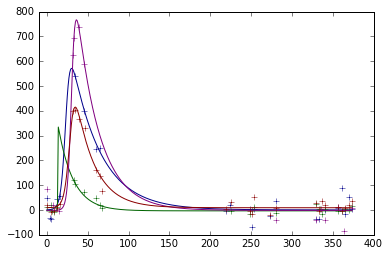

>>>>>>>>62


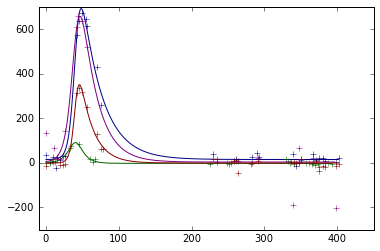

>>>>>>>>63


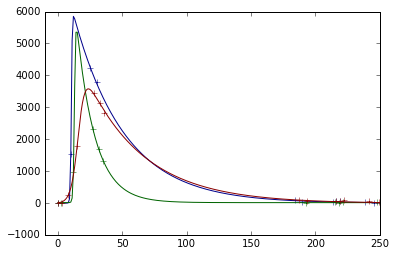

>>>>>>>>64


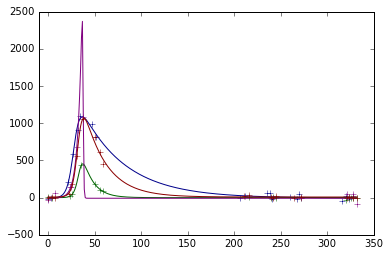

>>>>>>>>65


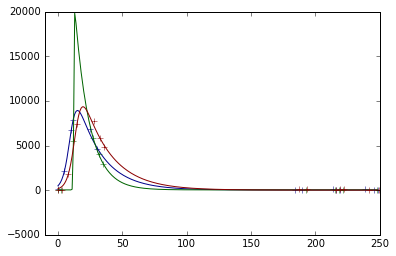

>>>>>>>>66


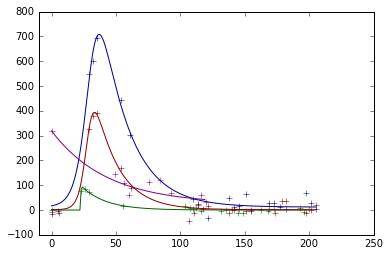

>>>>>>>>67


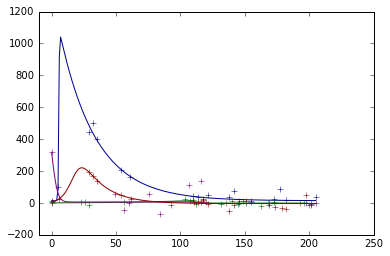

>>>>>>>>68


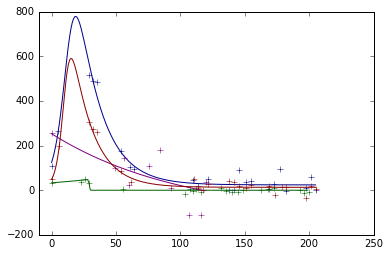

>>>>>>>>69


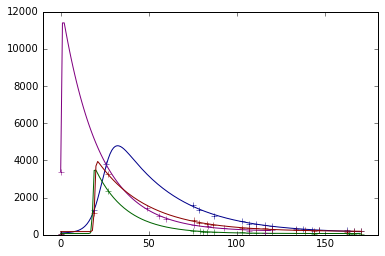

>>>>>>>>70


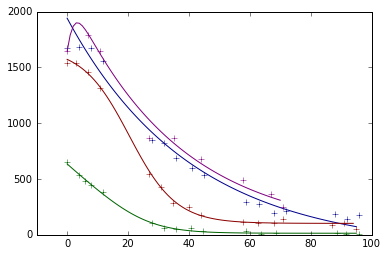

>>>>>>>>71


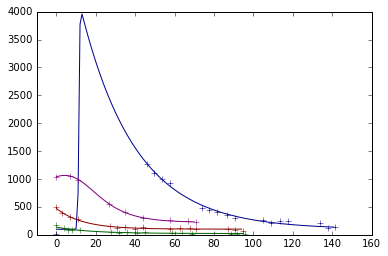

>>>>>>>>72


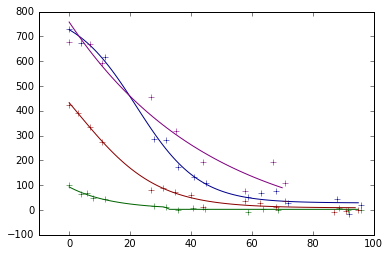

>>>>>>>>73


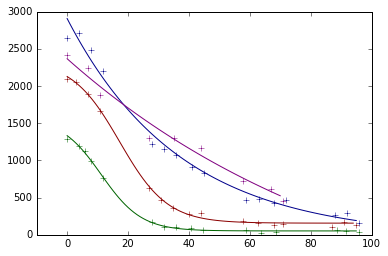

>>>>>>>>74


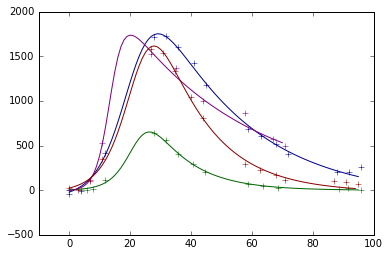

>>>>>>>>75


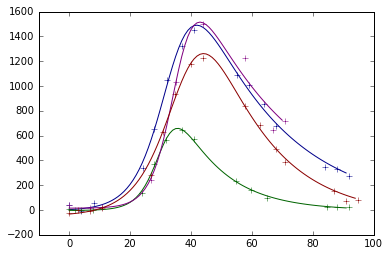

>>>>>>>>76


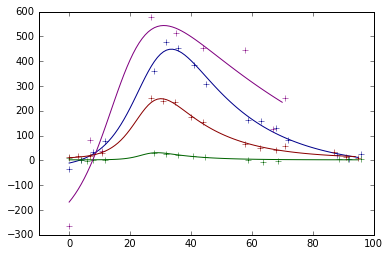

>>>>>>>>77


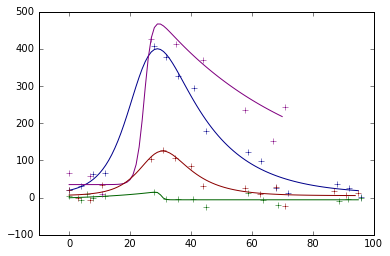

>>>>>>>>78


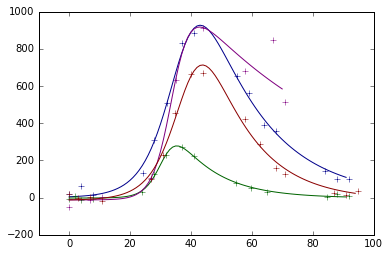

>>>>>>>>79


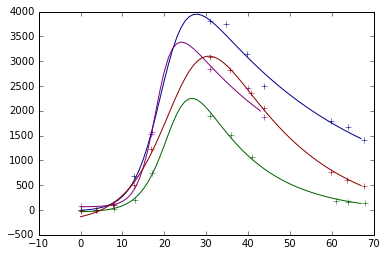

>>>>>>>>80


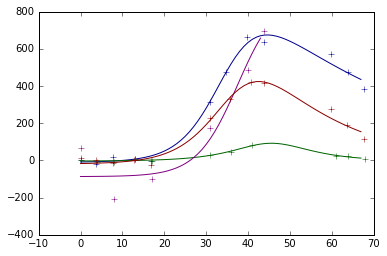

>>>>>>>>81


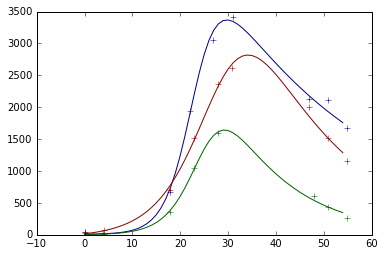

>>>>>>>>82


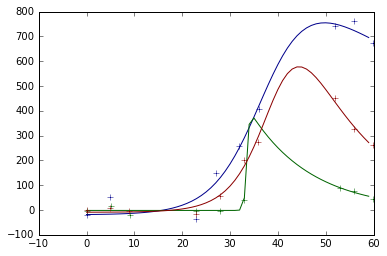

In [89]:
values = []
for i, lc in enumerate(snls_array):
    print ">>>>>>>>"+str(i)
    values.append(skewed_gaussian_chi(lc))
    plt.show()
    

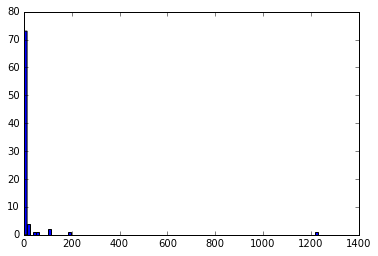

(72, ' of ', 83)


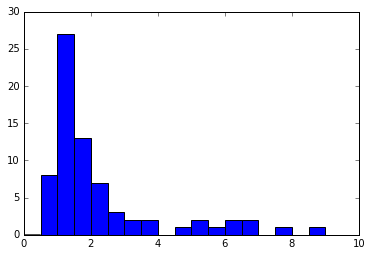

In [90]:
plt.hist(values, bins=100)
plt.show()


a = np.array(values)
b = a[a < 10]
plt.hist(b, bins=20, range=(0,10))
print(len(b), " of ",len(chi_sqrds))